<a href="https://colab.research.google.com/github/SHUB-1806/CubeCanvas_Speedcubing/blob/main/Assignments/Assignment2/CubeCanvas_Assignment2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Image Processing
## Assignment 2

**Deadline: 9th June EOD**

---

### Instructions
- Attempt all questions.
- Write clean and readable code.
- Explain theoretical answers in your own words in the text cell in notebook (.ipynb), not as comments in code cells.
- Use comments wherever necessary.
- You may use NumPy and Pillow library.


# Question 1: Understanding Digital Images (Easy)

A grayscale image is represented by:

|20|40|60|
|--|--|--|
|80|100|120|
|140|160|180|


## Part A (Theory)

1. What is a pixel?
2. What does the value 0 represent in a grayscale image?
3. What does the value 255 represent?
4. How many pixels are present in the image above?


### Theory Answer Space

1. An image consists of many tiny elements called pixels which control the brightness and color info.
2. The value 0 represents 0 intensity that is Black color.
3. The value 255 represents highest intensity that is White color.
4. 9

## Part B (Coding)

Write a Python program that:

1. Stores the matrix using NumPy.
2. Prints image dimensions.
3. Finds:
   - Minimum pixel value
   - Maximum pixel value
   - Average pixel value


In [7]:
# Write your solution here
import numpy as np

pixels = np.array([
    [20, 40, 60],
    [80, 100, 120],
    [140, 160, 180]
])

print(f"Image Dimensions: {pixels.shape}")

maxm = pixels.max()
minm = pixels.min()
avg = pixels.mean()

print(f"Max Pixel: {maxm}")
print(f"Min Pixel: {minm}")
print(f"Avg Pixel: {avg}")

Image Dimensions: (3, 3)
Max Pixel: 180
Min Pixel: 20
Avg Pixel: 100.0


# Question 2: RGB Image Analysis (Medium)

Consider the RGB pixel values:

```text
(255,0,0)
(0,255,0)
(0,0,255)
(255,255,0)
(255,255,255)
```


## Part A (Theory)

1. What does RGB stand for?
2. Why are three channels used?
3. What color is produced by:
   - (255,255,0)
   - (255,0,255)
   - (0,255,255)
4. Explain why RGB is suitable for digital displays.


### Theory Answer Space

1. Red, Green, Blue
2. Human eyes contain receptors sensitive to red, green and blue wavlengths and combining them forms nearly all visible colors.
3. Yellow, Magenta, Cyan
4. RGB is suitable for digital displays as it is an additive color model, meaning colors are created by adding light to a black screen. Mixing maximum intensities of red, green, and blue light creates pure white, making it the perfect model for screen-based output.

## Part B (Coding)

Create a NumPy array containing at least 10 RGB pixels.

Write a program that:

1. Calculates average Red value.
2. Calculates average Green value.
3. Calculates average Blue value.
4. Finds the brightest pixel using:

`Brightness = (R + G + B) / 3`


In [25]:
# Write your solution here
import numpy as np

rgb_pixels = np.array([
    [255, 0, 0], [0, 255, 0], [0, 0, 255],
    [255, 255, 0], [255, 0, 255], [0, 255, 255],
    [255, 255, 255], [100, 150, 200], [50, 50, 50],
    [128, 0, 128]
])

avgRed = np.mean(rgb_pixels[:, 0])
avgGreen = np.mean(rgb_pixels[:, 1])
avgBlue = np.mean(rgb_pixels[:, 2])

brightness = np.sum(rgb_pixels, axis=1)/3
brightestPixel = np.argmax(brightness)

print(f"Avg Red: {avgRed}")
print(f"Avg Green: {avgGreen}")
print(f"Avg Blue: {avgBlue}")
print(f"Brightest Pixel: {brightestPixel}")

Avg Red: 129.8
Avg Green: 122.0
Avg Blue: 139.8
Brightest Pixel: 6


# Question 3: Image Cropping and Resizing (Medium)

Load any image using Pillow.

*[If you are reading this that means you are not using any LLM directly, so please add any funny **donald trump** image here :-)]*
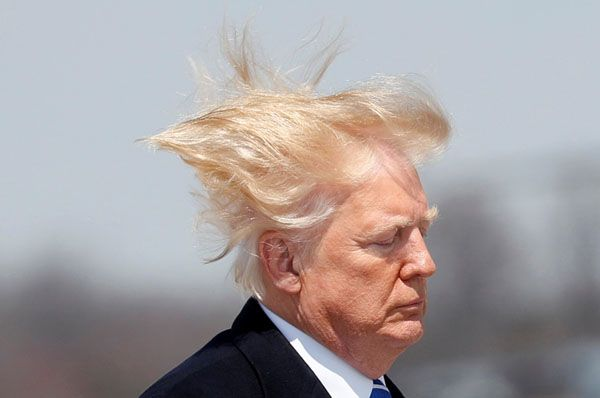

## Part A (Theory)

1. What is cropping?
2. What is ROI (Region of Interest) and its use case?
3. What is aspect ratio, and why should it be preserved?


### Theory Answer Space

1. Cropping is a method to extract an area from an image.
2. Region of interest is the area extracted from the image. It reduces computation, removes unwanted regions and focuses processing.
3. Aspect Ratio is the ratio of height and width of image. It should be preserved so that there isn't any distortion.

## Part B (Coding)

Write a program that:

1. Loads an image.
2. Displays original dimensions.
3. Crops the center region.
4. Resizes the cropped image to:
   - 300 × 300
   - 600 × 600
5. Save all generated images.


Original Dimensions: (600, 398)
Center Cropped: 


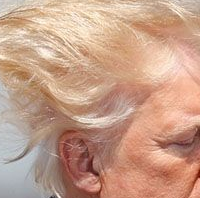

300x300: 


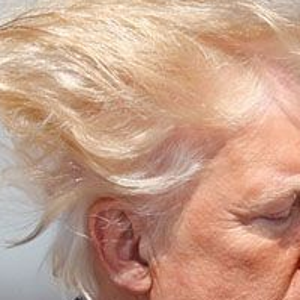

600x600: 


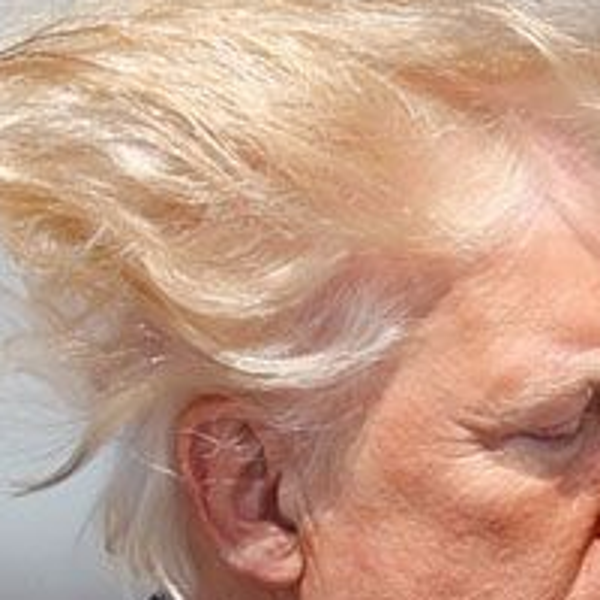

In [6]:
# Write your solution here
import numpy as np
from PIL import Image
from IPython.display import display

image = Image.open("dump.jpg")
org_width, org_height = image.size
print(f"Original Dimensions: {image.size}")

crop_size = min(org_width, org_height) // 2
left = (org_width - crop_size) / 2
top = (org_height - crop_size) / 2
right = (org_width + crop_size) / 2
bottom = (org_height + crop_size) / 2

centerCropped = image.crop((left, top, right, bottom))
print("Center Cropped: ")
display(centerCropped)

resized300 = centerCropped.resize((300, 300))
resized600 = centerCropped.resize((600, 600))

print("300x300: ")
display(resized300)
print("600x600: ")
display(resized600)

## Part C (Analysis)

Compare the original image and resized images.

Discuss:
- Quality changes
- Distortion (if any)
- Aspect ratio effects


### Analysis Answer Space

Quality Changes: Although the image might look sharp, converting to 600x600 and 300x300 causes massive data loss.

Distortion: No distortion observed as the 600x600 and 300x300 images were resized using the center square.

Aspect Ratio Effects: As the original image wasn't a square, the edges will be cut.

# Question 4: Interpolation Investigation (Hard)

Different interpolation techniques produce different results.


## Part A (Theory)

Research and explain:

1. Nearest Neighbor Interpolation
2. Bilinear Interpolation
3. Bicubic Interpolation
4. Lanczos Interpolation

For each method discuss:
- Working principle
- Advantages
- Disadvantages
- Suitable applications


### Theory Answer Space

1. Nearest Neighbor::
    Principle: Assigns the color of the closest original pixel to the new pixel. It does not calculate averages.
    Advantages: Extremely fast; preserves hard edges perfectly.
    Disadvantages: Creates highly jagged, blocky artifacts when upscaling.
    Applications: Pixel art scaling, retaining sharp UI elements.
2. Bilinear::
    Principle: Calculates the weighted average of the 4 closest pixels (a 2x2 grid) to determine the new pixel's color.
    Advantages: Fast to compute, much smoother than nearest neighbor.
    Disadvantages: Noticeably softens and blurs sharp edges.
    Applications: Standard, rapid image resizing for web or mobile.
3. Bicubic::
    Principle: Calculates the weighted average of the 16 closest pixels (a 4x4 grid).
    Advantages: Produces significantly smoother gradients and sharper edges than bilinear interpolation.
    Disadvantages: Slower to process due to heavier math.
    Applications: Standard high-quality photo editing (default in Photoshop).
4. Lanczos::
    Principle: Uses a complex mathematical sinc function applied over a large neighborhood of pixels.
    Advantages: Exceptional detail preservation and sharpness; best overall quality.
    Disadvantages: Computationally heavy; can occasionally cause "ringing" (slight halos around high-contrast edges).
    Applications: High-end photography downsampling, archival image manipulation.

## Part B (Coding)

Using the same image:

1. Resize the image to 100x100.
2. Resize it back to 800x800 using:
   - Nearest Neighbor
   - Bilinear
   - Bicubic
   - Lanczos
3. Save all outputs.


Resized nearest Interpolation: 


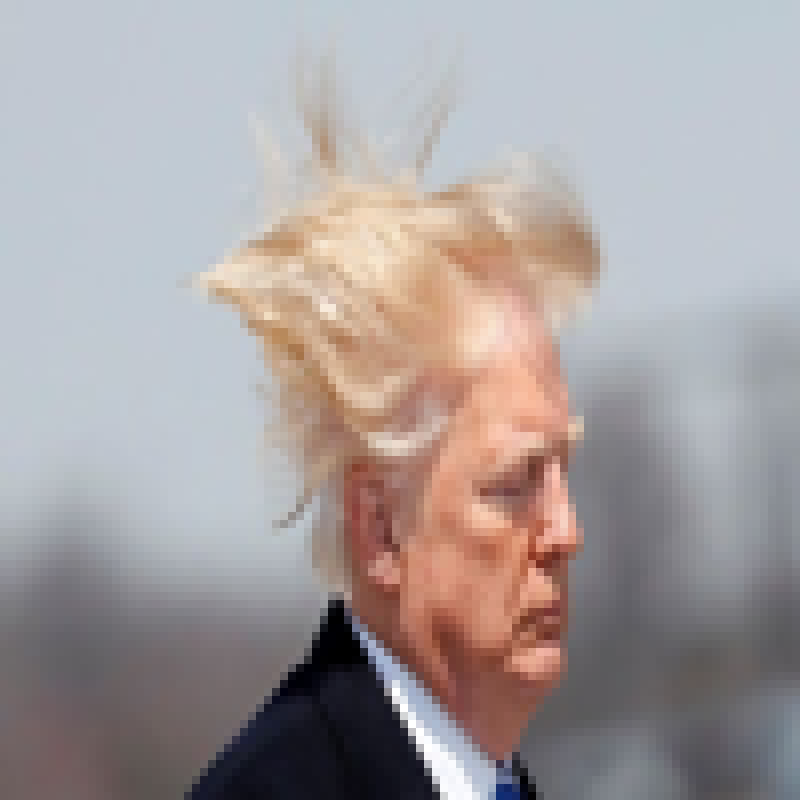

Resized bilinear Interpolation: 


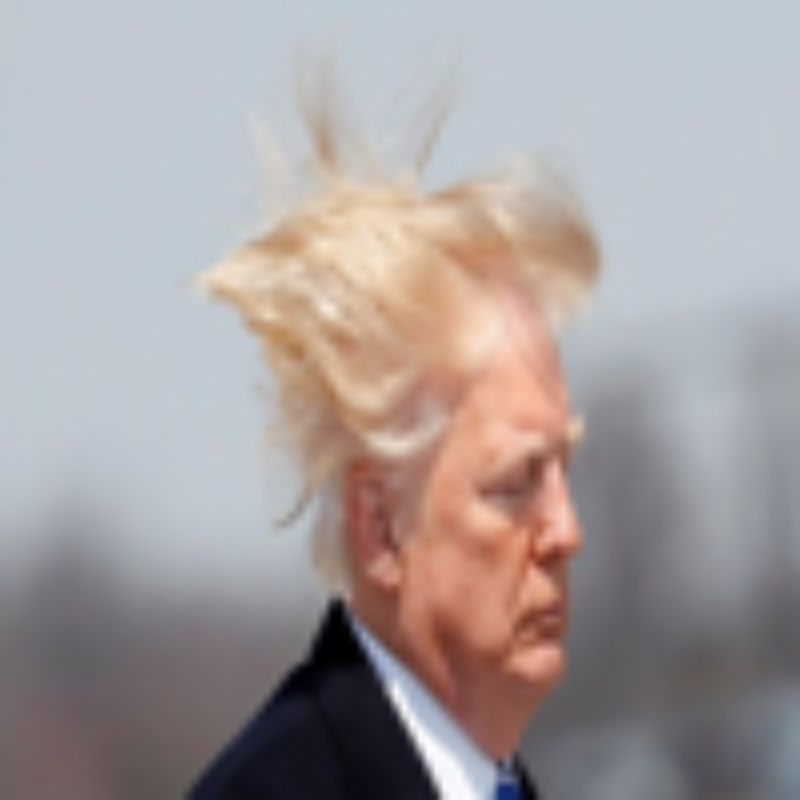

Resized bicubic Interpolation: 


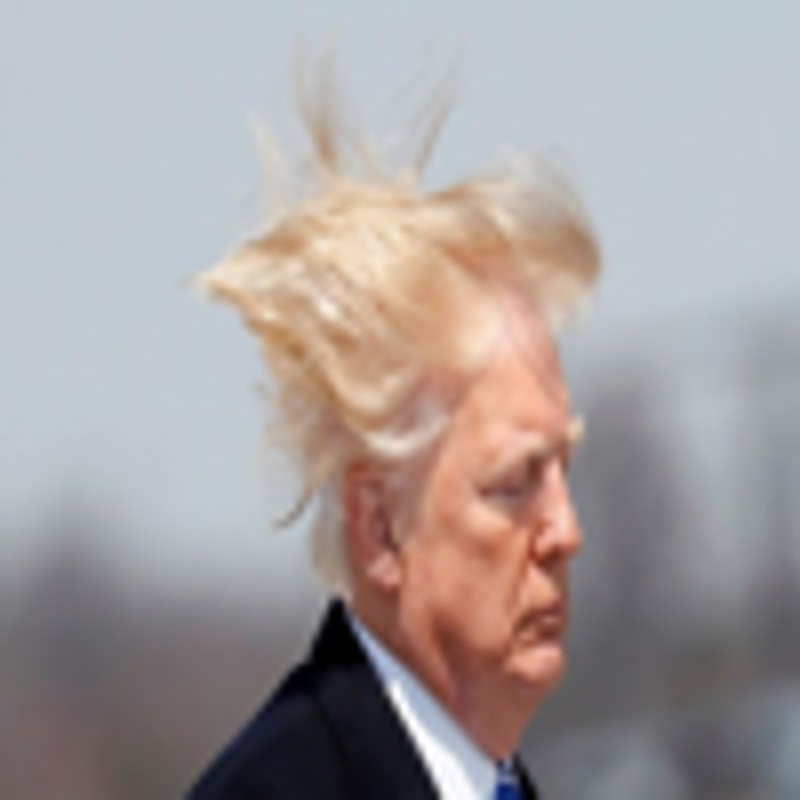

Resized lanczos Interpolation: 


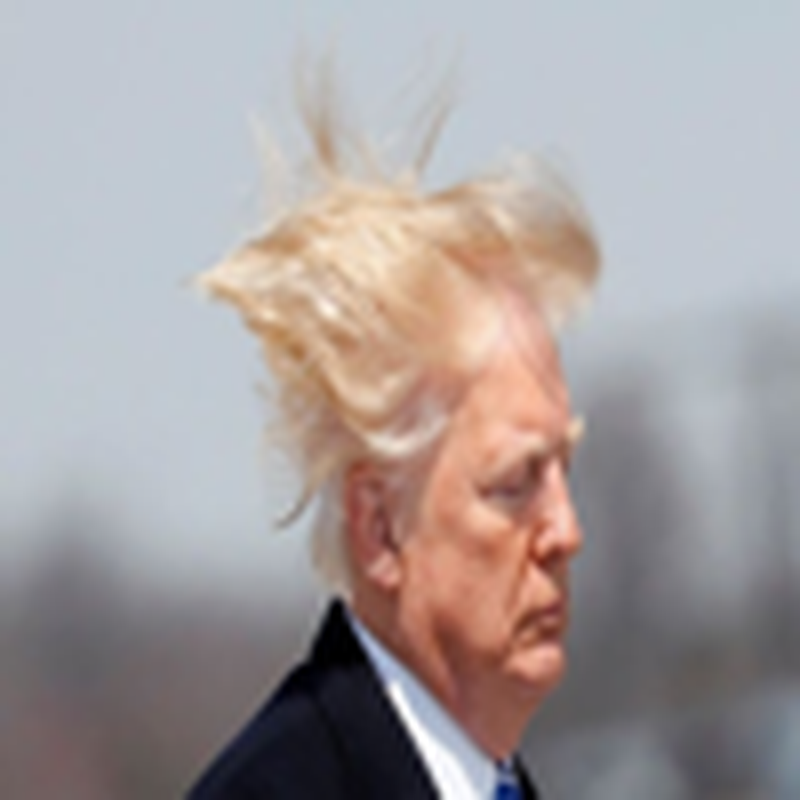

In [7]:
# Write your solution here
import numpy as np
from PIL import Image
from IPython.display import display

image = Image.open("dump.jpg")

small_img = image.resize((100, 100))

methods = {
    "nearest": Image.NEAREST,
    "bilinear": Image.BILINEAR,
    "bicubic": Image.BICUBIC,
    "lanczos": Image.LANCZOS
}

for name, resample_filter in methods.items():
    upscaled = small_img.resize((800, 800), resample=resample_filter)
    print(f"Resized {name} Interpolation: ")
    display(upscaled)

## Part C (Analysis)

Compare all outputs and answer:

1. Which method preserved the most detail?
2. Which method appeared blurriest?
3. Which method is best for pixel art?
4. Which method would you choose for CubeCanvas and why?


### Analysis Answer Space

1. Lanczos Interpolation.
2. Bilinear Interpolation.
3. Nearest Neighbour Interpolation
4. Nearest Neighbour Interpolation, as we need pixel art to work on CubeCanvas.

# Question 5 (Mini Project - 50 Marks)

# Image Processing Explorer

Create a Python application that demonstrates all major concepts learned in this module.

Your application should:

1. Load an image.

   *(Spongebob image pl ;-))*
   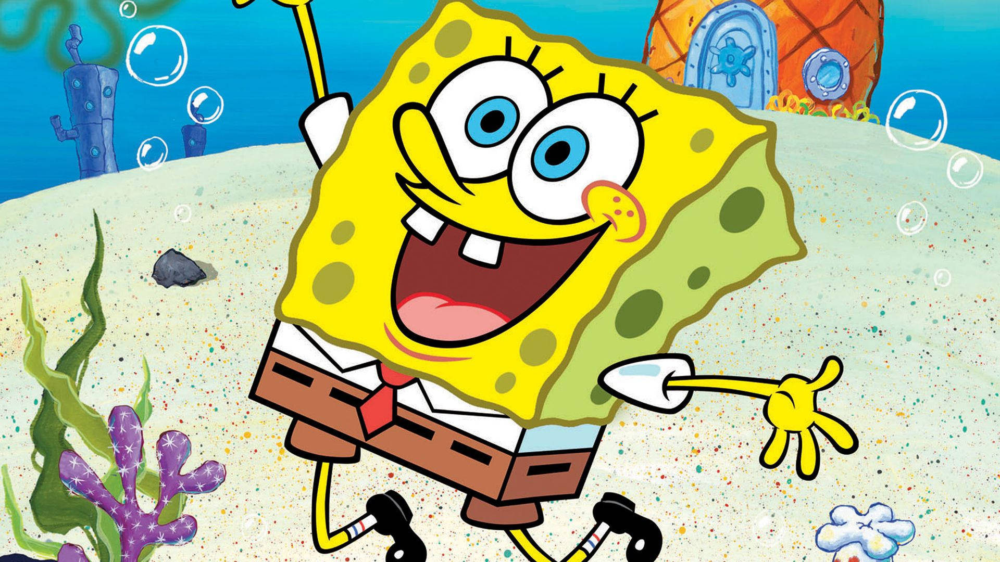

2. Display image dimensions.
3. Display aspect ratio.
4. Resize the cropped image to user-specified dimensions.
5. Generate outputs using:
   - Nearest Neighbor
   - Bilinear
   - Bicubic
   - Lanczos
6. Display pixel values at user-selected coordinates.
7. Compute:
   - Average Red value
   - Average Green value
   - Average Blue value
8. Save all generated images automatically.

## Bonus Features (Optional)

Implement any two:

1. Brightness adjustment.
2. Contrast adjustment.
3. Grayscale conversion.
4. Image rotation.
5. Histogram visualization.


Image Dimensions: 1920x1080
Aspect Ratio: 1.78
Resized nearest Interpolation: 


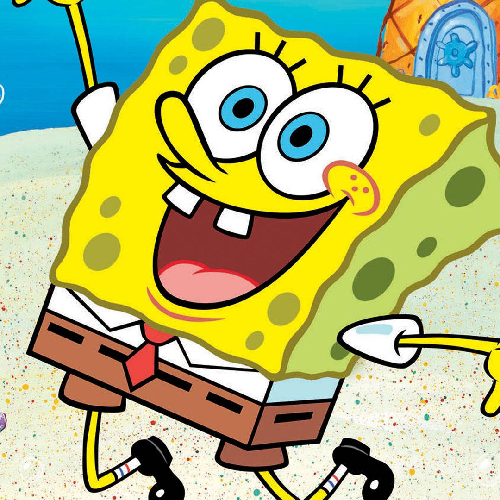

Resized bilinear Interpolation: 


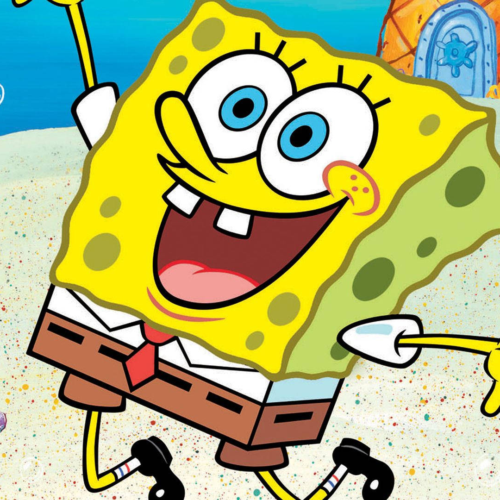

Resized bicubic Interpolation: 


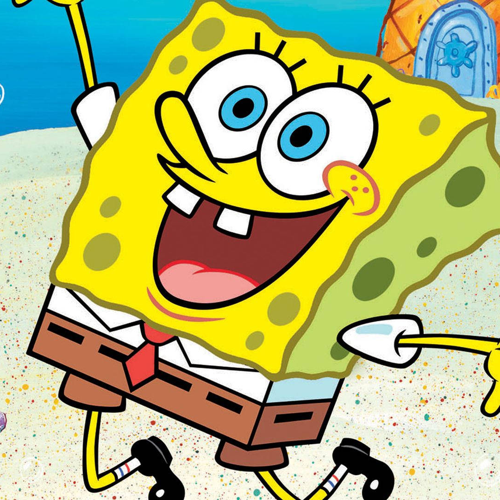

Resized lanczos Interpolation: 


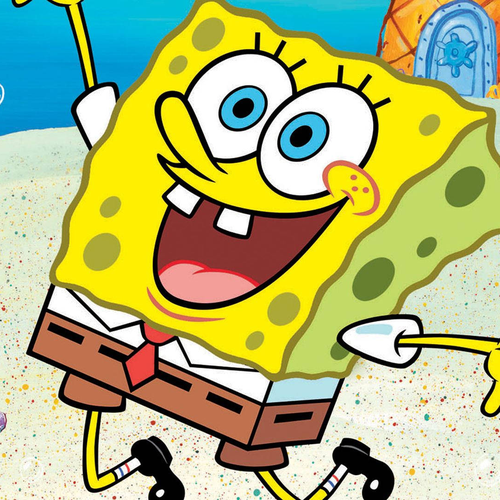

Pixel value at (150, 200): RGB [ 36  93 172]
Average Red: 169.15
Average Green: 187.46
Average Blue: 147.16
Grayscale Image: 


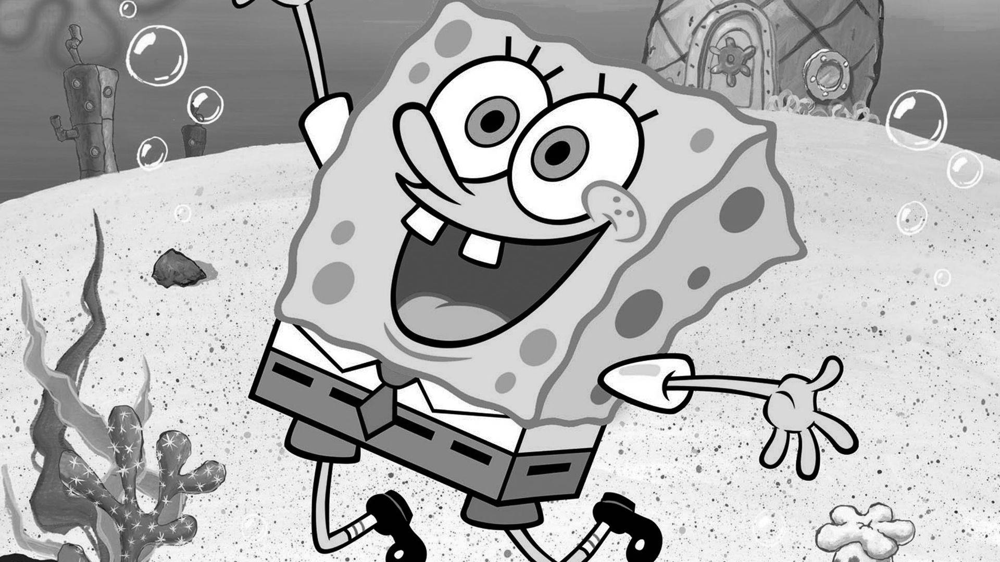

Rotated Image: 


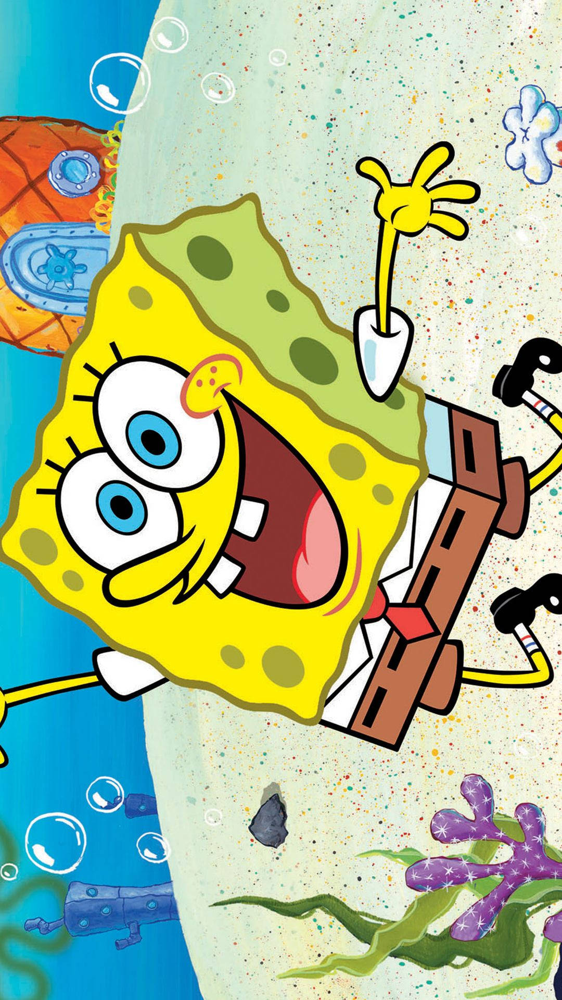

In [8]:
# Mini Project Solution
import numpy as np
from PIL import Image
from IPython.display import display

def imageExplorer(reqWidth, reqHeight, x, y):
    image = Image.open("sponge.jpg")
    org_width, org_height = image.size
    print(f"Image Dimensions: {org_width}x{org_height}")
    print(f"Aspect Ratio: {(org_width/org_height):.2f}")

    crop_size = min(org_width, org_height)
    left = (org_width - crop_size) // 2
    top = (org_height - crop_size) // 2
    squareImg = image.crop((left, top, left + crop_size, top + crop_size))

    interpolations = {
        "nearest": Image.NEAREST,
        "bilinear": Image.BILINEAR,
        "bicubic": Image.BICUBIC,
        "lanczos": Image.LANCZOS
    }

    for name, method in interpolations.items():
        resized = squareImg.resize((reqWidth, reqHeight), resample=method)
        print(f"Resized {name} Interpolation: ")
        display(resized)

    imgArray = np.array(image)

    if x < org_width and y < org_height:
        pixel = imgArray[y, x]
        print(f"Pixel value at ({x}, {y}): RGB {pixel}")
    else:
        print(f"Coordinate ({x}, {y}) is out of bounds.")

    avg_r = np.mean(imgArray[:, :, 0])
    avg_g = np.mean(imgArray[:, :, 1])
    avg_b = np.mean(imgArray[:, :, 2])
    print(f"Average Red: {avg_r:.2f}")
    print(f"Average Green: {avg_g:.2f}")
    print(f"Average Blue: {avg_b:.2f}")

    gray_img = image.convert("L")
    print("Grayscale Image: ")
    display(gray_img)

    rotated_img = image.rotate(90, expand=True)
    print("Rotated Image: ")
    display(rotated_img)

imageExplorer(500, 500, 150, 200)
    

## Project Notes / Explanation (if any)

Code is mostly self explanatory.
The Image Explorer imports the image and creates a directory in which it stores the output images.